# Review VWC

The following notebook is a series of figures and tables to review volumetric water content (VWC) as estimated by Hesham using "representative" bulk density values with VWC values estimated by Bryan Carlson using bulk density values taken in 1999.

The term "legacy" values refer to those estimated by Heshram. The term "revised" refer to the values estimated by Carlson.

In [1]:
# Setup
import pandas as pd
import pathlib
import glob
import os
import seaborn as sns
import matplotlib.pyplot as plt
from src.p00_calculate_vwc_from_revised_bulkdensity import *

inputDir = pathlib.Path.cwd() / "data" / "input"
workingDir = pathlib.Path.cwd() / "data" / "working"
outputDir = pathlib.Path.cwd() / "data" / "output"




In [2]:
# Get output file to review
filePath = sorted(outputDir.glob("VolumetricWaterContentFromRevisedBd_*.csv"))[-1]

In [3]:
# Load data
revisedVwc = pd.read_csv(filePath)

In [4]:
# Load legacy VWC calculated by Hesham using "representative" bulk density values
vwcAggregate = getVwcSpringFallCalcAggregate(
            inputDir / "VwcSpringFallCalc",
            [0, 13, 14, 15, 16, 17],
            ["ID2", "VWC_1", "VWC_2", "VWC_3", "VWC_4", "VWC_5"])
legacyVwc = tidyVwcSpringFallCalcAggregate(
            vwcAggregate, 
            "VolumetricWaterContent")

In [5]:
# Compare VWC values, old/legacy (estimated by Heshram) with new/revised (estimated by Bryan)
vwcCompare = pd.merge(
    legacyVwc, 
    revisedVwc[["ID2", "Year", "Season", "BottomDepth", "VolumetricWaterContent"]], 
    on=["Year", "Season", "ID2", "BottomDepth"],
    suffixes=("_legacy", "_revised"))

## Scatter plot of Legacy vs Revised VWC values for two seasons

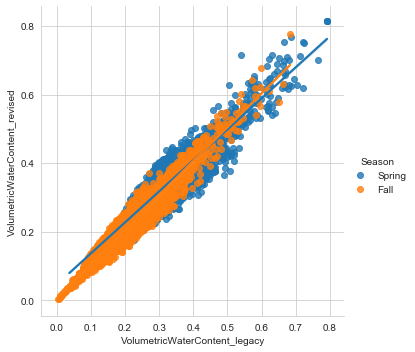

In [6]:
sns.set_style("whitegrid")
sns.lmplot(
    x="VolumetricWaterContent_legacy", 
    y="VolumetricWaterContent_revised", 
    hue="Season",
    data=vwcCompare)

In [7]:
vwcCompareMap = pd.merge(
    legacyVwc, 
    revisedVwc[["ID2", "Year", "Season", "Latitude", "Longitude", "BottomDepth", "VolumetricWaterContent"]], 
    how="right",
    on=["Year", "Season", "ID2", "BottomDepth"],
    suffixes=("_legacy", "_revised"))

# Differences between Legacy and Revised VWC

vwcDiff = legacy - revised

In [8]:
import geopandas
gdf = geopandas.GeoDataFrame(
    vwcCompareMap,
    geometry=geopandas.points_from_xy(vwcCompareMap.Longitude, vwcCompareMap.Latitude))
gdf = gdf.assign(
    vwcDiff = gdf["VolumetricWaterContent_legacy"] - gdf["VolumetricWaterContent_revised"])
gdf["coords"] = gdf["geometry"].apply(lambda x: x.representative_point().coords[:])
gdf["coords"] = [coords[0] for coords in gdf["coords"]]
gdf[["VolumetricWaterContent_legacy", "VolumetricWaterContent_revised", "vwcDiff"]].describe()


,VolumetricWaterContent_legacy,VolumetricWaterContent_revised,vwcDiff
count,14608.000000,14608.000000,14608.000000
mean,0.263745,0.275493,-0.011748
std,0.101570,0.103415,0.024627
min,0.004369,0.004190,-0.173099
25%,0.177268,0.185834,-0.024216
50%,0.266346,0.281383,-0.010614
75%,0.333076,0.350069,0.001131
max,0.791843,0.815646,0.129836


## By Year and Season

### BottomDepth = 1 ft

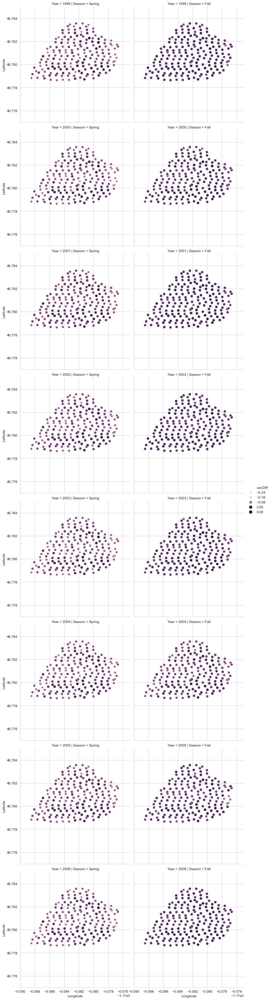

In [9]:
g = sns.relplot(
    data = gdf[gdf["BottomDepth"] == 1.0],
    x="Longitude",
    y="Latitude",
    col="Season",
    row="Year",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))


## By Depth and Year, graphs and extreme outliers

Extreme outliers = points outside 3 * IQR of vwcDiff

### Years: 1999-2002, Season: Spring

In [10]:
# Preperation
dropColsForPrettyPrint = ["Latitude_x", "Longitude_x", "geometry", "coords", "Latitude_y", "Longitude_y", "VolumetricWaterContent"]

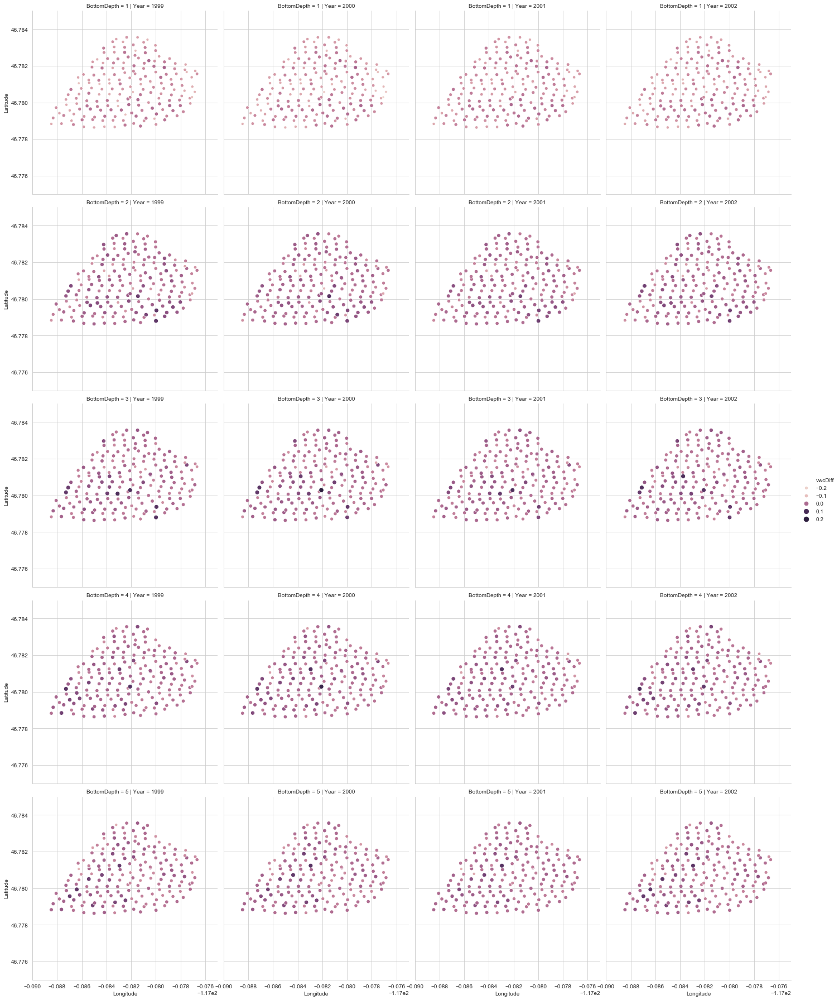

In [11]:
sliceEarlyYearsSpring = gdf[(gdf["Season"] == "Spring") & (gdf["Year"] < 2003)]
g = sns.relplot(
    data = sliceEarlyYearsSpring,
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))

In [12]:
qs = sliceEarlyYearsSpring["vwcDiff"].quantile([0.25, 0.50, 0.75])

q1 = qs[0.25]
q3 = qs[0.75]
iqr = q3 - q1

lowOutlier = q1 - (iqr * 3)
highOutlier = q3 + (iqr * 3)

(sliceEarlyYearsSpring[(sliceEarlyYearsSpring["vwcDiff"] < lowOutlier) | (sliceEarlyYearsSpring["vwcDiff"] > highOutlier)]
    .merge(revisedVwc, how = "left", on = ["Year", "Season", "ID2", "BottomDepth"])
    .drop(columns = dropColsForPrettyPrint)
    .sort_values(by = ["ID2", "Year", "Season", "BottomDepth"]))

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,VolumetricWaterContent_revised,vwcDiff,TopDepth,BulkDensity,GravimetricWaterContent,Notes
0,161,2000,Spring,3,0.491305,0.365463,0.125842,2.0,1.07116,0.341184,NaN
1,161,2000,Spring,4,0.518139,0.405699,0.112440,3.0,1.16666,0.347744,NaN


### Years: 2003-2006, Season: Spring

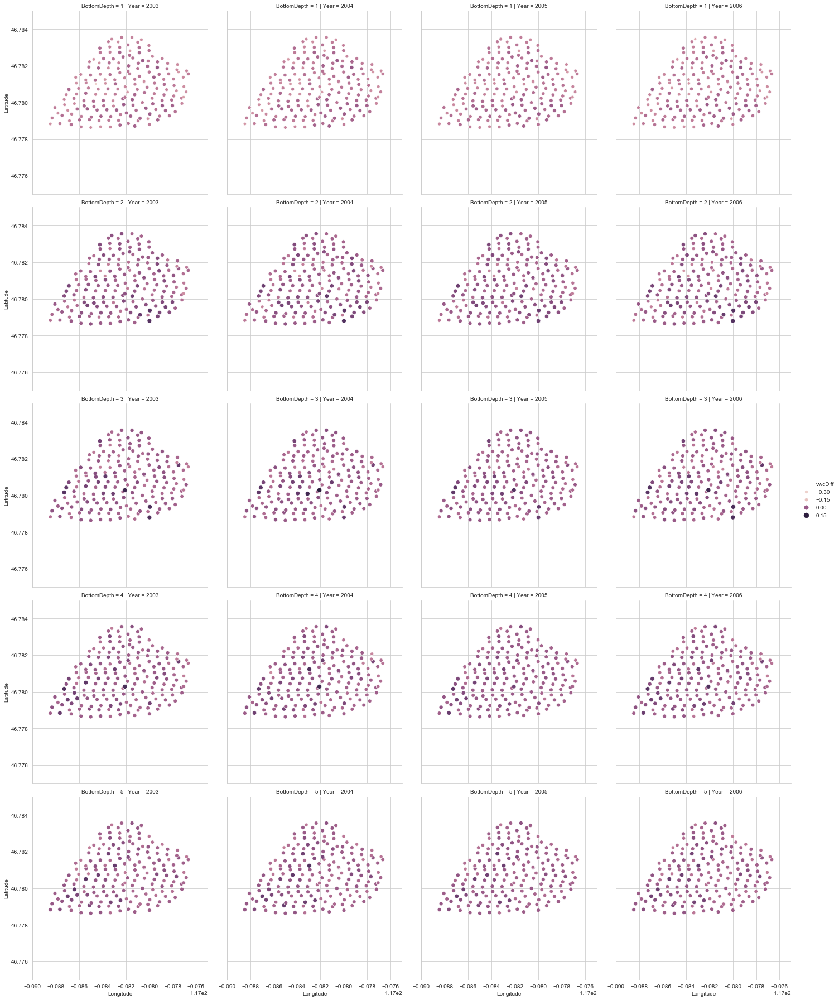

In [13]:
sliceLateYearsSpring = gdf[(gdf["Season"] == "Spring") & (gdf["Year"] > 2002)]
g = sns.relplot(
    data = sliceLateYearsSpring,
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))

In [14]:
qs = sliceLateYearsSpring["vwcDiff"].quantile([0.25, 0.50, 0.75])

q1 = qs[0.25]
q3 = qs[0.75]
iqr = q3 - q1

lowOutlier = q1 - (iqr * 3)
highOutlier = q3 + (iqr * 3)

(sliceLateYearsSpring[(sliceLateYearsSpring["vwcDiff"] < lowOutlier) | (sliceLateYearsSpring["vwcDiff"] > highOutlier)]
    .merge(revisedVwc, how = "left", on = ["Year", "Season", "ID2", "BottomDepth"])
    .drop(columns = dropColsForPrettyPrint)
    .sort_values(by = ["ID2", "Year", "Season", "BottomDepth"]))

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,VolumetricWaterContent_revised,vwcDiff,TopDepth,BulkDensity,GravimetricWaterContent,Notes
1,161,2003,Spring,3,0.423282,0.314863,0.108419,2.0,1.071160,0.293946,NaN
2,161,2004,Spring,3,0.506897,0.377061,0.129836,2.0,1.071160,0.352012,NaN
0,205,2003,Spring,1,0.540930,0.714029,-0.173099,0.0,1.504802,0.474500,NaN


### Years: 1999-2002, Season: Fall

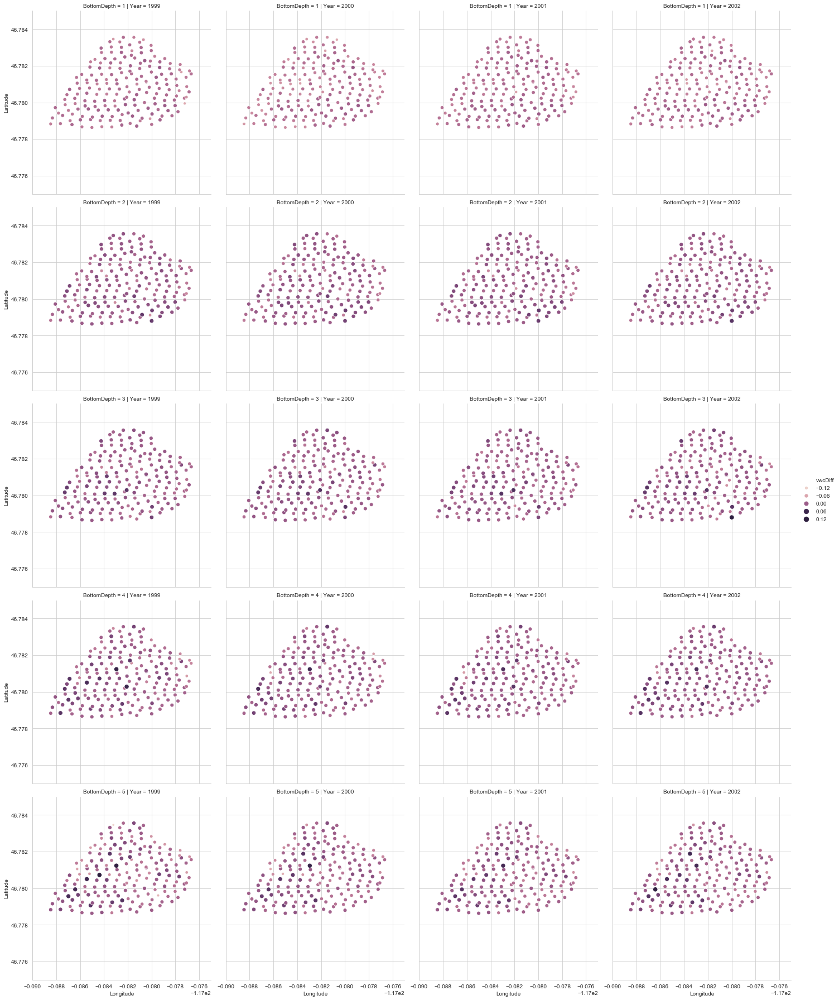

In [15]:
sliceEarlyYearsFall = gdf[(gdf["Season"] == "Fall") & (gdf["Year"] < 2003)]
g = sns.relplot(
    data = sliceEarlyYearsFall,
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))

In [16]:
qs = sliceEarlyYearsFall["vwcDiff"].quantile([0.25, 0.50, 0.75])

q1 = qs[0.25]
q3 = qs[0.75]
iqr = q3 - q1

lowOutlier = q1 - (iqr * 3)
highOutlier = q3 + (iqr * 3)

(sliceEarlyYearsFall[(sliceEarlyYearsFall["vwcDiff"] < lowOutlier) | (sliceEarlyYearsFall["vwcDiff"] > highOutlier)]
    .merge(revisedVwc, how = "left", on = ["Year", "Season", "ID2", "BottomDepth"])
    .drop(columns = dropColsForPrettyPrint)
    .sort_values(by = ["ID2", "Year", "Season", "BottomDepth"]))

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,VolumetricWaterContent_revised,vwcDiff,TopDepth,BulkDensity,GravimetricWaterContent,Notes
0,17,2002,Fall,3,0.411228,0.342047,0.069181,2.0,1.172795,0.291651,NaN
4,99,2002,Fall,5,0.396497,0.327972,0.068524,4.0,1.265578,0.259148,NaN
1,161,1999,Fall,4,0.278246,0.217865,0.060381,3.0,1.166660,0.186742,NaN
5,181,1999,Fall,5,0.650011,0.579472,0.070539,4.0,1.470943,0.393946,NaN
2,233,1999,Fall,4,0.339644,0.275111,0.064533,3.0,1.239296,0.221990,NaN
6,233,1999,Fall,5,0.342590,0.275255,0.067336,4.0,1.229281,0.223915,NaN
3,233,2000,Fall,5,0.315515,0.253501,0.062014,4.0,1.229281,0.206219,NaN
7,419,1999,Fall,5,0.683452,0.775204,-0.091752,4.0,1.701372,0.455634,NaN


### Years: 2003-2003, Season: Fall

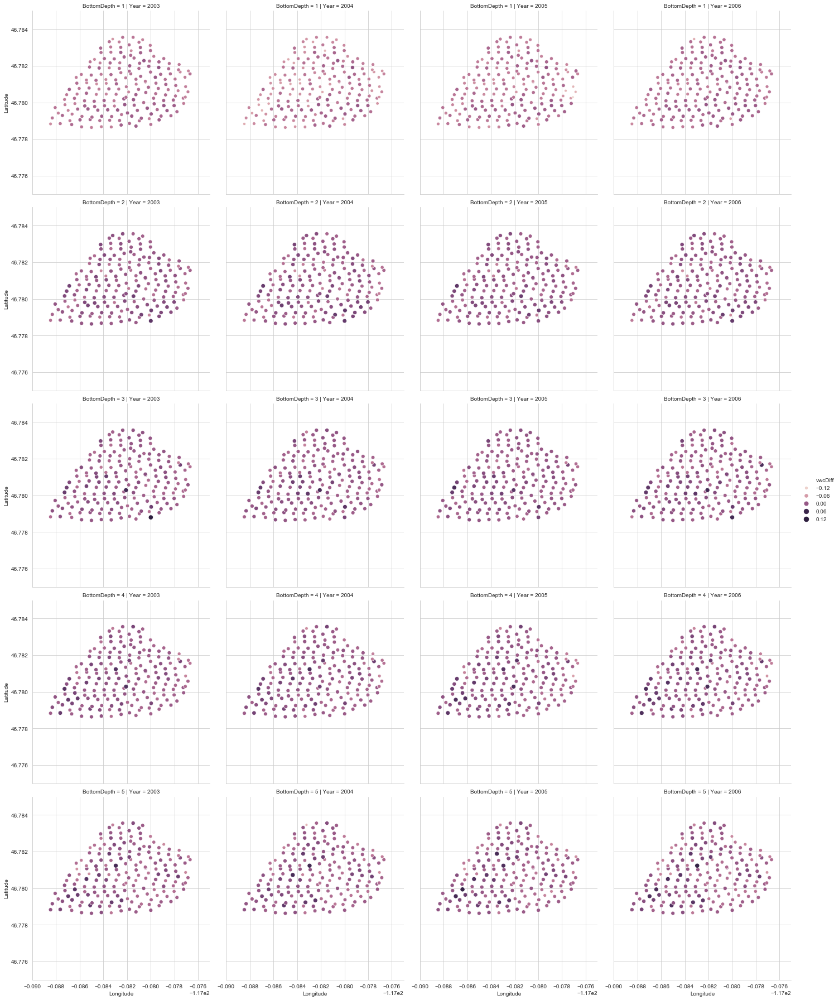

In [17]:
sliceLateYearsFall = gdf[(gdf["Season"] == "Fall") & (gdf["Year"] > 2002)]
g = sns.relplot(
    data = sliceLateYearsFall,
    x="Longitude",
    y="Latitude",
    col="Year",
    row="BottomDepth",
    kind="scatter",
    size="vwcDiff", 
    hue="vwcDiff")
g.set(ylim=(46.775, 46.785))
g.set(xlim=(-117.090, -117.075))

In [18]:
qs = sliceLateYearsFall["vwcDiff"].quantile([0.25, 0.50, 0.75])

q1 = qs[0.25]
q3 = qs[0.75]
iqr = q3 - q1

lowOutlier = q1 - (iqr * 3)
highOutlier = q3 + (iqr * 3)

(sliceLateYearsFall[(sliceLateYearsFall["vwcDiff"] < lowOutlier) | (sliceLateYearsFall["vwcDiff"] > highOutlier)]
    .merge(revisedVwc, how = "left", on = ["Year", "Season", "ID2", "BottomDepth"])
    .drop(columns = dropColsForPrettyPrint)
    .sort_values(by = ["ID2", "Year", "Season", "BottomDepth"]))

,ID2,Year,Season,BottomDepth,VolumetricWaterContent_legacy,VolumetricWaterContent_revised,vwcDiff,TopDepth,BulkDensity,GravimetricWaterContent,Notes
3,17,2003,Fall,3,0.419615,0.349022,0.070592,2.0,1.172795,0.297599,NaN
5,99,2005,Fall,5,0.369327,0.305498,0.063829,4.0,1.265578,0.241390,NaN
1,173,2005,Fall,1,0.270258,0.371209,-0.100951,0.0,1.593303,0.232981,NaN
2,197,2005,Fall,1,0.258694,0.339947,-0.081253,0.0,1.498060,0.226925,NaN
6,233,2006,Fall,5,0.327955,0.263496,0.064459,4.0,1.229281,0.214350,NaN
0,377,2004,Fall,1,0.233041,0.315294,-0.082253,0.0,1.434130,0.219850,NaN
4,419,2004,Fall,5,0.597400,0.677600,-0.080200,4.0,1.701372,0.398267,NaN
